In [2]:
import pathlib
import numpy as np
import scipy as sp
import pandas as pd
from matplotlib import pyplot as plt


import statsmodels.api as sm
from statsmodels.formula.api import mixedlm

import SessionTools.two_photon as st2p

plt.rcParams['pdf.fonttype']=42

%load_ext autoreload
%autoreload 2 


%matplotlib inline

In [3]:
def get_ts(pp, coef = 0):
    y = pp.calculate_zscored_F('rois', zscore=False, exp_detrend = True)-1
    
    
    #shift heading so that bar not visible is pi/-pi
    heading = np.angle(np.exp(1j*(-1*pp.voltage_recording_aligned[' Heading'].to_numpy()-np.pi)))
    bar_vis_mask = np.abs(heading)<3*np.pi/4
   
    y_sm = sp.ndimage.gaussian_filter1d(sp.ndimage.gaussian_filter1d(y, 1, axis=-1),.5,axis=1, mode='wrap')
    y_sm -= np.nanpercentile(y_sm,5,axis=-1,keepdims=True)
    
    
    n_rois = y.shape[1]
    
    # vector average
    x_f,y_f = st2p.utilities.pol2cart(y[-1,:,:] ,np.linspace(-np.pi,np.pi,num=n_rois)[:,np.newaxis])
    rho, phi = st2p.utilities.cart2pol(x_f.mean(axis=0), y_f.mean(axis=0))


    _,offset = st2p.utilities.cart2pol(*st2p.utilities.pol2cart(np.ones(heading.shape),phi-heading))

    
    return {'heading': heading,
            'bar_vis_mask': bar_vis_mask,
            'y': y,
            'y_sm': y_sm,
            'rho': rho,
            'phi': phi,
            'offset': offset}


def align_to_heading(ts):
    
    # digitize heading to 16 discrete values
    heading_bins = np.linspace(-np.pi, np.pi, num=17)
    heading_dig = np.digitize(ts['heading'], heading_bins)-1 


    y_h_aligned = np.zeros([1,*ts['y'].shape[1:]])
    for ind in range(ts['heading'].shape[0]):
        # circularly rotate rows to align heading
        y_h_aligned[-1,:,ind] = np.roll(ts['y'][-1,:,ind], -heading_dig[ind]-8)
    
    return heading_bins, y_h_aligned

In [4]:
basedir = pathlib.Path('/media/mplitt/SSD_storage/2P_scratch/R20A02_R56H10_split_GRABDA2m')

sess_df = pd.read_csv(basedir / 'sessions.csv')
print(sess_df.columns)
sess_df['fly_id'] = [row['date']+'_'+row['fly'] for _, row in sess_df.iterrows()]

figfolder = pathlib.Path('/media/mplitt/SSD_storage/fig_scratch/R20A02_R56H10_split_GRABDA2m')
figfolder.mkdir(parents=True, exist_ok=True)

sess_df = sess_df.loc[sess_df['usable']==1]


Index(['date', 'fly', 'session', 'closed_loop', 'usable', 'fictrac_dat_file',
       'notes'],
      dtype='object')


In [5]:
sess_df.head()

,date,fly,session,closed_loop,usable,fictrac_dat_file,notes,fly_id
0,22_11_2024,fly1,closed_loop-000,1,1,NaN,NaN,22_11_2024_fly1
1,22_11_2024,fly1,dark-001,0,1,NaN,NaN,22_11_2024_fly1
2,22_11_2024,fly1,closed_loop-002,1,1,NaN,NaN,22_11_2024_fly1
3,22_11_2024,fly1,dark-003,0,1,NaN,NaN,22_11_2024_fly1
4,22_11_2024,fly2,closed_loop-000,1,1,NaN,NaN,22_11_2024_fly2


[0.   0.25 0.5  0.75 1.   1.25 1.5  1.75 2.   2.25 2.5  2.75 3.   3.25
 3.5  3.75 4.   4.25 4.5  4.75 5.   5.25 5.5  5.75 6.   6.25]
(11, 26)


/tmp/ipykernel_203074/3735974706.py:50: RuntimeWarning: Mean of empty slice
  mu, sem = np.nanmean(or_dark,axis=0), sp.stats.sem(or_dark, axis=0, nan_policy='omit')
/tmp/ipykernel_203074/3735974706.py:57: RuntimeWarning: Mean of empty slice
  mu, sem = np.nanmean(or_cl, axis=0), sp.stats.sem(or_cl, axis=0, nan_policy='omit')


(-10.0, 350.0)

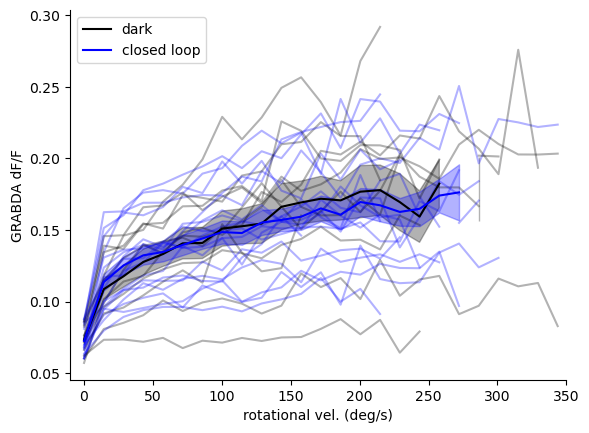

In [6]:


fig, ax = plt.subplots()
dh_bins = np.arange(0,2*np.pi,.25)
print(dh_bins)

or_cl, or_dark = [], []

for i, (_, row) in enumerate(sess_df.iterrows()):

    outdir = pathlib.PurePath( basedir / row['date'] /  row['fly'] / row['session'] / 'preprocess.pkl')
    pp = st2p.preprocessing.EBImagingSession.from_file(outdir)

    ts = get_ts(pp,coef=0)
    volume_times = np.array(pp.metadata['frame_times'])[:,0]
    dt = (volume_times[1:]-volume_times[:-1]).mean()
    # print(dt)
        
    dh = np.abs(np.ediff1d(np.unwrap(ts['heading']),to_begin=ts['heading'][0]))/dt
    
    
    
    outer_ring = np.squeeze(pp.calculate_zscored_F('outer_ring', zscore=False, exp_detrend = True).mean(axis=1)-1)
    outer_ring_sm = sp.ndimage.gaussian_filter1d(outer_ring, 1, axis=-1)
    outer_ring_sm -= np.nanpercentile(outer_ring_sm,5,axis=-1,keepdims=True)
    
    
    dh_dig = np.digitize(dh, dh_bins)
    
    outer_ring_bin = np.nan*np.zeros_like(dh_bins)
    for i, b in enumerate(dh_bins):
        # print(b)
        if i>0:
            inds = dh_dig ==i
            if inds.sum()>10:
                outer_ring_bin[i-1] = outer_ring_sm[inds].mean()
            
    # outer_ring_bin = np.array([outer_ring_sm[dh_dig == i].mean() for i in range(dh_bins.shape[0])])
    
    # ax.scatter(dh, outer_ring_sm)
    if row['closed_loop']==0:
        or_dark.append(outer_ring_bin)
        ax.plot(dh_bins/np.pi*180, outer_ring_bin, color='black', alpha=.3)
    else:
        or_cl.append(outer_ring_bin)
        ax.plot(dh_bins/np.pi*180, outer_ring_bin, color='blue', alpha=.3)
        

or_dark, or_cl = np.stack(or_dark), np.stack(or_cl)
nan_mask = (~np.isnan(or_dark)).sum(axis=0)<5
print(or_dark.shape)
mu, sem = np.nanmean(or_dark,axis=0), sp.stats.sem(or_dark, axis=0, nan_policy='omit')
mu[nan_mask]=np.nan
sem[nan_mask]=np.nan
ax.plot(dh_bins/np.pi*180, mu, color='black', label='dark')
ax.fill_between(dh_bins/np.pi*180, mu-sem, mu+sem, color='black', alpha=.3)

nan_mask = (~np.isnan(or_cl)).sum(axis=0)<5
mu, sem = np.nanmean(or_cl, axis=0), sp.stats.sem(or_cl, axis=0, nan_policy='omit')
mu[nan_mask]=np.nan
sem[nan_mask]=np.nan
ax.plot(dh_bins/np.pi*180, mu, color='blue', label='closed loop')
ax.fill_between(dh_bins/np.pi*180, mu-sem, mu+sem, color='blue', alpha=.3)
ax.legend()
ax.set_ylabel('GRABDA dF/F')
ax.set_xlabel('rotational vel. (deg/s)')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlim([-10, 350])

In [7]:
stats_df = {'fly_id': [],
           'cl': [],
           'offset_var':[],
           'offset_var_nomask': [],
           'offset_mean': [],
           'offset_mag': []}


for _,row in sess_df.iterrows():
    
    outdir = pathlib.PurePath( basedir / row['date'] / row['fly'] / row['session'] / 'preprocess.pkl')
    

    pp = st2p.preprocessing.EBImagingSession.from_file(outdir)
    dff = pp.calculate_zscored_F('rois', zscore=False, exp_detrend = True)[-1, :, :] -1
    # note smoothing conditions
    dff = sp.ndimage.gaussian_filter1d(sp.ndimage.gaussian_filter1d(dff, 1, axis=-1),.5,axis=0, mode='wrap')


    heading = -1*pp.voltage_recording_aligned[' Heading'].to_numpy()
    dh = np.abs(np.ediff1d(np.unwrap(heading),to_begin=heading[0]))/dt
    
    h_mask = (np.abs(heading)> np.pi/4) * (dh>.1) # excluding 90 degrees directly behind the fly


    x_f,y_f = st2p.utilities.pol2cart(dff ,np.linspace(-np.pi,np.pi,num=dff.shape[0])[:,np.newaxis])
    rho,phi = st2p.utilities.cart2pol(x_f.mean(axis=0), y_f.mean(axis=0)) # vector average
    # rho - population vector magnitude
    # phi - population vector angle
    _,offset = st2p.utilities.cart2pol(*st2p.utilities.pol2cart(np.ones(heading.shape),phi-heading))
    # print(sp.stats.circmean(offset))
    
    
    stats_df['fly_id'].append(row['fly_id'])
    stats_df['cl'].append(row['closed_loop'])


    stats_df['offset_var'].append(sp.stats.circvar(offset[h_mask]))
    stats_df['offset_var_nomask'].append(sp.stats.circvar(offset))
    stats_df['offset_mean'].append(sp.stats.circmean(offset[h_mask]))
    stats_df['offset_mag'].append( np.abs(np.exp(1j*offset).mean()))
    # print( np.abs(np.exp(1j*offset).mean()))

stats_df = pd.DataFrame.from_dict(stats_df)

In [8]:
#reduce to one entry per condition per fly by averaging
stats_df_unique = {'fly_id': [],
                   'cl': [],
                   'offset_var':[],
                   'offset_var_logit':[],
                   'offset_mean':[],
                   'offset_mag':[],
                   }

fly_ids = stats_df['fly_id'].unique()
for r, fly in enumerate(fly_ids):
    
    cl_mask = (stats_df['fly_id']==fly)*(stats_df['cl']>=1) # closed_loop ==1 is the very first experience in closed loop
                                                           # closed_loop >1 takes data where fly has at least 10 min of 
                                                           # experience prior to imaging
    dark_mask = (stats_df['fly_id']==fly)*(stats_df['cl']==0) 
    if (cl_mask.sum()>0) and (dark_mask.sum()>0): # take only flies with both closed loop and dark data
        
        
        cl = stats_df['offset_var'].loc[cl_mask].mean() #average across sessions
        cl_mu = sp.stats.circmean(stats_df['offset_mean'].loc[cl_mask])

        stats_df_unique['fly_id'].append(fly)
        stats_df_unique['cl'].append(1)
        stats_df_unique['offset_var'].append(cl)
        stats_df_unique['offset_var_logit'].append(sp.special.logit(cl)) # logit transform for mixed effects model below
        stats_df_unique['offset_mean'].append(cl_mu)
        stats_df_unique['offset_mag'].append(stats_df['offset_mag'].loc[cl_mask].mean())
    
        dark = stats_df['offset_var'].loc[dark_mask].mean() # average across flies
        dark_mu = sp.stats.circmean(stats_df['offset_mean'].loc[dark_mask])
        
        stats_df_unique['fly_id'].append(fly)
        stats_df_unique['cl'].append(0)
        stats_df_unique['offset_var'].append(dark)
        stats_df_unique['offset_var_logit'].append(sp.special.logit(dark)) # logit tranform for mixed effect model below
        stats_df_unique['offset_mean'].append(dark_mu)
        stats_df_unique['offset_mag'].append(stats_df['offset_mag'].loc[dark_mask].mean())
        
stats_df_unique = pd.DataFrame.from_dict(stats_df_unique)

In [9]:
# reformat for plotting only
stats_df_plot = {'fly_id': [],
                 'offset_var_dark':[],
                 'offset_var_closed_loop':[],
                }
fly_ids = stats_df_unique['fly_id'].unique()
for fly in fly_ids:
    stats_df_plot['fly_id'].append(fly)
    
    fly_mask = stats_df_unique['fly_id']==fly
    
    _df = stats_df_unique.loc[fly_mask]
    # stats_df_plot['rnai'].append(_df['rnai'].iloc[0])
    
    _df_d = _df.loc[_df['cl']==0]
    stats_df_plot['offset_var_dark'].append(_df_d['offset_var'].iloc[0])
    
    _df_cl = _df.loc[_df['cl']==1]
    stats_df_plot['offset_var_closed_loop'].append(_df_cl['offset_var'].iloc[0])
stats_df_plot = pd.DataFrame.from_dict(stats_df_plot)

[['22_11_2024_fly1' 0.7779087358865802 0.9077584395390065]
 ['22_11_2024_fly2' 0.8136974401137116 0.7921533631295871]
 ['22_11_2024_fly3' 0.9289650002220836 0.9884394328397296]
 ['02_01_2025_fly1' 0.915486314999862 0.9386881337323154]
 ['02_01_2025_fly2' 0.8635247336514789 0.9467570806465542]
 ['03_01_2025_fly1' 0.924674112458935 0.9559971300434918]
 ['03_01_2025_fly2' 0.8613165652010826 0.9130198983169516]
 ['03_01_2025_fly3' 0.9516986937372576 0.9391528645811764]
 ['08_01_2025_fly1' 0.8337746265607922 0.9173260876425109]
 ['08_01_2025_fly2' 0.9080706370801027 0.8190558512729071]]
WilcoxonResult(statistic=12.0, pvalue=0.130859375)


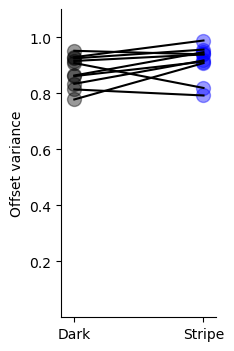

In [10]:
fig,ax = plt.subplots(figsize=[2,4])



ax.plot([0,1], stats_df_plot[['offset_var_dark', 'offset_var_closed_loop']].T, color='black')
ax.scatter(np.zeros((stats_df_plot.shape[0],)), stats_df_plot['offset_var_dark'], color='black', alpha=.4, s=100)
ax.scatter(np.ones((stats_df_plot.shape[0],)), stats_df_plot['offset_var_closed_loop'], color='blue', alpha=.4, s=100)



ax.set_ylim([0.0,1.1])
ax.set_xlim([-.1,1.1])
ax.set_yticks([.2,.4,.6,.8,1.])

ax.set_xticks([0, 1], labels=['Dark', 'Stripe'])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
    
ax.set_ylabel('Offset variance')


# fig.savefig(figfolder / 'offset_var_summary.pdf', format='pdf')
print(stats_df_plot.to_numpy())
res= sp.stats.wilcoxon(stats_df_plot['offset_var_dark']-stats_df_plot['offset_var_closed_loop'])
print(res)

In [37]:
eg_folder = figfolder / 'example_sessions' 
eg_folder.mkdir(parents=True, exist_ok=True)

/tmp/ipykernel_112865/1798468204.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax=plt.subplots(1,1, figsize=[15,3])


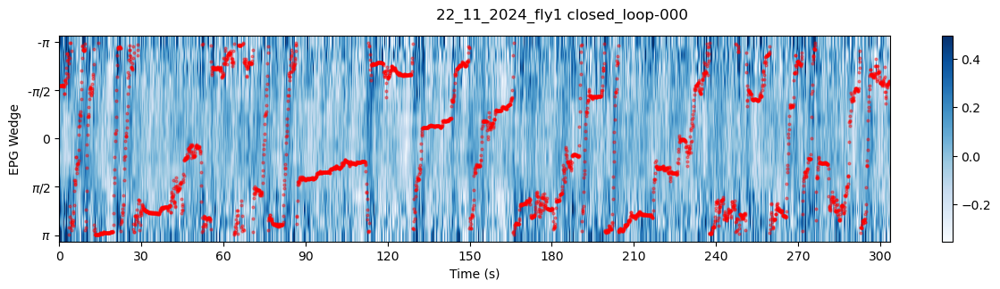

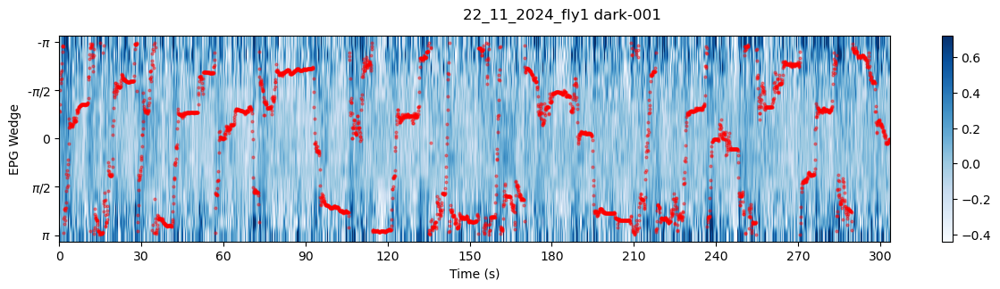

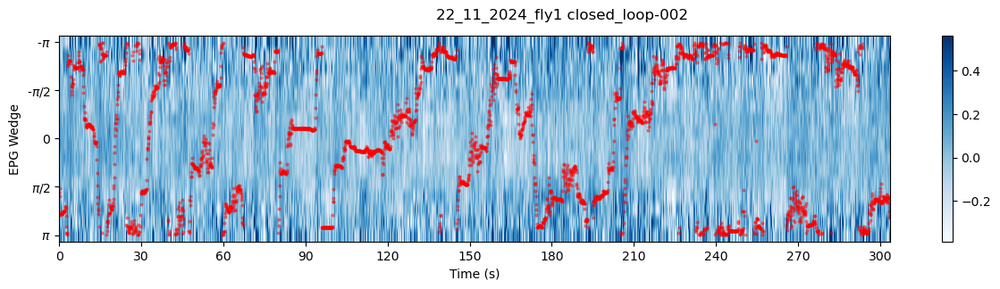

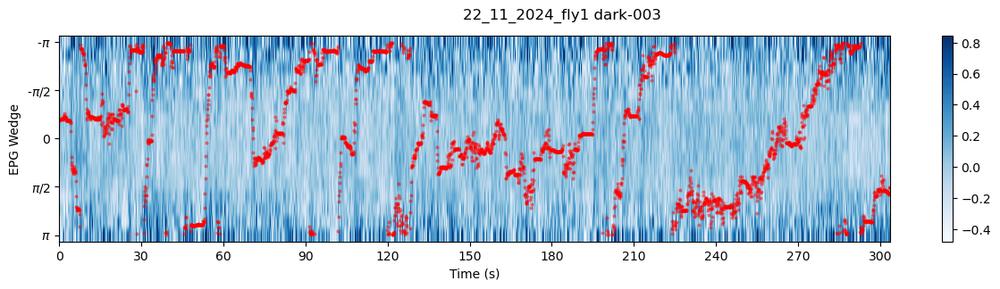

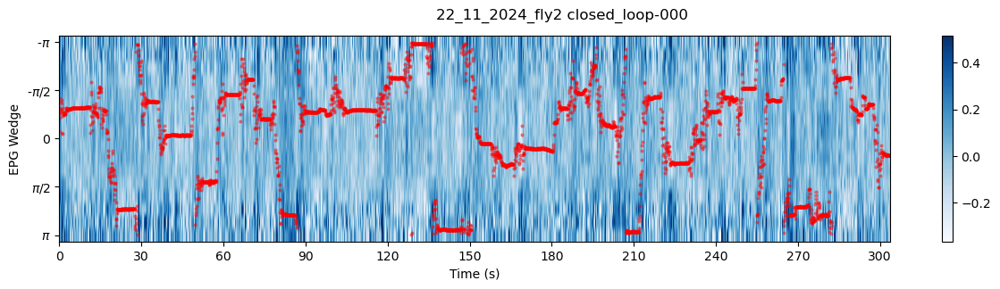

...

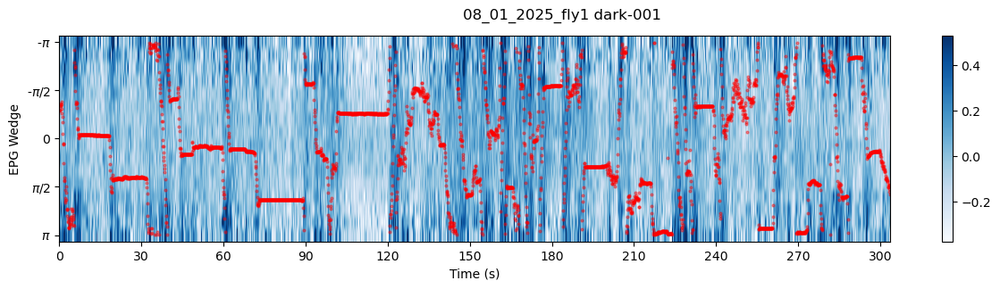

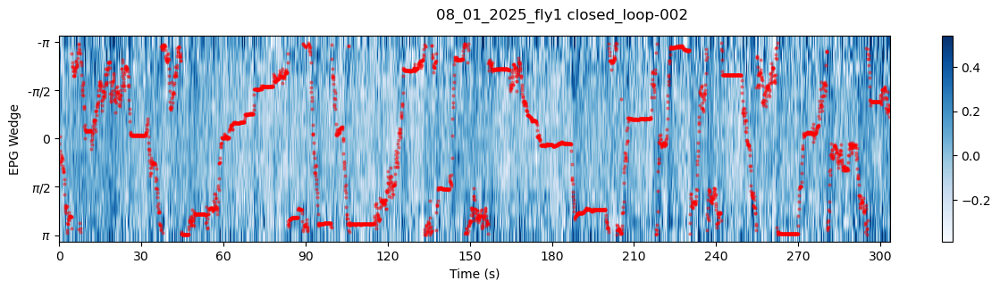

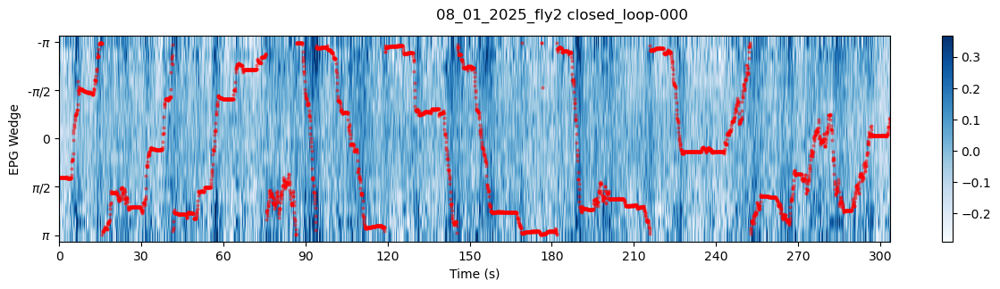

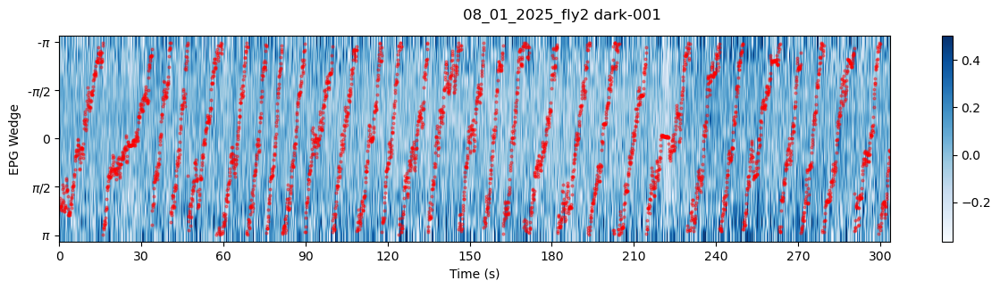

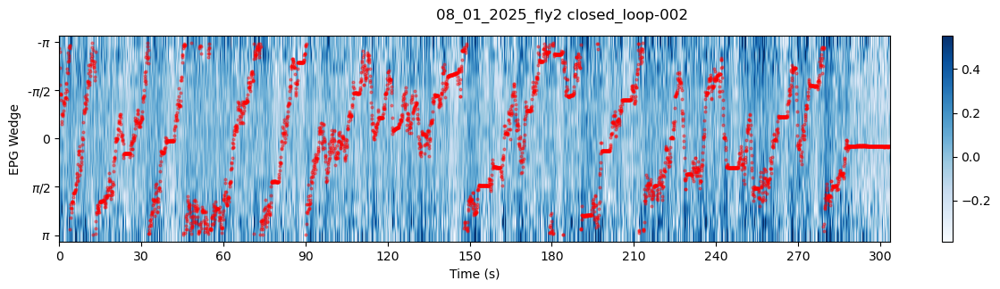

In [38]:
for i, (_, row) in enumerate(sess_df.iterrows()):
    
    outdir = pathlib.PurePath( basedir / row['date'] /  row['fly'] / row['session'] / 'preprocess.pkl')
    pp = st2p.preprocessing.EBImagingSession.from_file(outdir)
    
    ts = get_ts(pp,coef=0)
    
    bins = np.arange(16)
    dt = pp.metadata['frame_period']*pp.metadata['layout']['frames_per_sequence']
    
    
    fig, ax=plt.subplots(1,1, figsize=[15,3])
    plt.subplots_adjust(wspace=0)
    h = ax.imshow(ts['y'][-1,:,:]-1,aspect='auto',cmap='Blues', 
                 vmin=np.percentile(ts['y'][-1,:,:]-1,5), 
                 vmax=np.percentile(ts['y'][-1,:,:]-1,95))
    plt.colorbar(h)
    _heading = 15*(ts['heading']+np.pi)/2/np.pi # put heading on plotting scale
    
    
    x = np.arange(_heading.shape[0]) # volume index
    t = np.arange(0,x[-1]*dt+1E-5,dt) # time
    time_to_index = sp.interpolate.interp1d(t,x, kind='linear') # look up function for plotting specific time values
    
    ax.scatter(x,_heading, color='red', s=4, alpha=.4) # overlay heading
    
    heading_bins, y_h_aligned = align_to_heading(ts) 
    
 
    
    
    # pretty up axes 
    time_ticks = np.arange(0,t[-1],30)
    ax.set_xticks(time_to_index(time_ticks),labels=[int(t) for t in time_ticks])
    
    ax.set_yticks([r/2/np.pi*15 for r in (0,  np.pi/2,  np.pi,  6*np.pi/4,  2*np.pi)], 
                                                 labels = [r'-$\pi$',  r'-$\pi$/2',  '0',  r'$\pi$/2',  r'$\pi$'])
    ax.set_ylabel('EPG Wedge')
    ax.set_xlabel('Time (s)')
   
    
    fig.suptitle(f"{row['fly_id']} {row['session']}")
    fig.savefig(eg_folder / f"{row['fly_id']}_{row['session']}.pdf")
    # plt.close(fig)

